In [1]:
import pandas as pd
import numpy as np
import seaborn
import importlib
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, PartOfSpeech
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.cluster import BaseCluster
from wordcloud import WordCloud
from scipy.cluster import hierarchy as sch
from utils import spanish_stopwords, create_vocabulary, clean_text,remove_brackets_and_parentheses

ignore_words = spanish_stopwords

%load_ext autoreload
%autoreload 2

#python -m spacy download es_core_news_sm


In [2]:
interventions = pd.read_json('../data/clean/interventions.json', orient='records')

In [3]:
interventions.speech = interventions.speech.apply(clean_text)

In [4]:
speeches = interventions.speech

In [5]:
load = True
embedding_model = SentenceTransformer("distiluse-base-multilingual-cased-v1")
approach = "speech"
if(not load):
    embeddings = embedding_model.encode(speeches, show_progress_bar=True)
    umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
    hdbscan_model = HDBSCAN(min_cluster_size=90, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
    reduced_embeddings = umap_model.fit_transform(embeddings)
    umap_model_2d = UMAP(n_components=2, n_neighbors=15, random_state=42, metric="cosine", verbose=False)
    reduced_embeddings_2d = umap_model_2d.fit_transform(embeddings)
    clusters = hdbscan_model.fit(reduced_embeddings).labels_
    with open(f'../data/approach_{approach}/5d_embeddings.npy', 'wb') as f:
            np.save(f, reduced_embeddings)
    with open(f'../data/approach_{approach}/2d_embeddings.npy', 'wb') as f:
            np.save(f, reduced_embeddings_2d)
    with open(f'../data/approach_{approach}/clusters.npy', 'wb') as f:
            np.save(f, clusters)
    with open(f'../data/approach_{approach}/embeddings.npy', 'wb') as f:
        np.save(f, embeddings)
else:
    with open(f'../data/approach_{approach}/5d_embeddings.npy', 'rb') as f:
            reduced_embeddings = np.load(f)
    with open(f'../data/approach_{approach}/2d_embeddings.npy', 'rb') as f:
            reduced_embeddings_2d = np.load(f)
    with open(f'../data/approach_{approach}/clusters.npy', 'rb') as f:
            clusters = np.load(f)
    with open(f'../data/approach_{approach}/embeddings.npy', 'rb') as f:
        embeddings = np.load(f)

In [13]:

# KeyBERT
keybert_model = KeyBERTInspired()

# Part-of-Speech
pos_model = PartOfSpeech("es_core_news_sm")

# MMR
KeyBert_Diverse = [KeyBERTInspired(top_n_words=30), MaximalMarginalRelevance(diversity=.5)]

#tfidf model
ctfidf_model = ClassTfidfTransformer(bm25_weighting=True, reduce_frequent_words=True)

# All representation models
representation_model = {
    "KeyBert_Diverse": KeyBert_Diverse,
    "Keybert": keybert_model,
    "PosModel": pos_model
}

In [14]:
from bertopic import BERTopic

class Dimensionality:
  """ Use this for pre-calculated reduced embeddings """
  def __init__(self, reduced_embeddings):
    self.reduced_embeddings = reduced_embeddings

  def fit(self, X):
    return self

  def transform(self, X):
    return self.reduced_embeddings


# Prepare sub-models
umap_model = Dimensionality(reduced_embeddings)
hdbscan_model = BaseCluster()

topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=CountVectorizer(stop_words=ignore_words, min_df = 0.1, max_df = 0.8),
  ctfidf_model=ctfidf_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)



# Train model
topic_model.fit(speeches, embeddings=embeddings, y=clusters)

# Show topics
topic_model.get_topic_info()

2024-04-24 18:51:01,885 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-04-24 18:51:01,886 - BERTopic - Dimensionality - Completed ✓
2024-04-24 18:51:01,888 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-04-24 18:51:01,901 - BERTopic - Cluster - Completed ✓
2024-04-24 18:51:01,916 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-04-24 18:52:31,984 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,KeyBert_Diverse,Keybert,PosModel,Representative_Docs
0,-1,54749,-1_fiscalía_transformación_investigación_gober...,"[fiscalía, transformación, investigación, gobe...","[neoliberal, corrupción, gobernador, mexicanos...","[neoliberal, corrupción, gobernador, mexicanos...","[fiscalía, transformación, investigación, gobe...","[Muy bien. Bueno, si les parece, vamos con la ..."
1,0,5741,0_vacunas_vacuna_vacunación_medicamentos,"[vacunas, vacuna, vacunación, medicamentos, mé...","[salud, vacunación, coronavirus, pandemia, vir...","[salud, vacunación, vacuna, vacunas, vacunar, ...","[vacunas, vacuna, vacunación, medicamentos, mé...","[Con su permiso, señor presidente. Saludo a to..."
2,1,3386,1_preguntarle_morena_opinión_quisiera,"[preguntarle, morena, opinión, quisiera, pregu...","[agradezco, expresidente, secretario, estatal,...","[agradezco, bienvenido, expresidente, presiden...","[morena, opinión, pregunta, compañeros, repúbl...",[Muy buenos días. Gracias a todos los medios a...
3,2,2389,2_migrantes_migratorio_biden_migración,"[migrantes, migratorio, biden, migración, trum...","[migratorios, vicepresidenta, consulados, repu...","[migratorios, migratorio, migración, migratori...","[migrantes, migratorio, migración, frontera, m...",[Es básicamente el tema migratorio y una propu...
4,3,2361,3_renuncia_cuánto_cuántos_empresarios,"[renuncia, cuánto, cuántos, empresarios, reuni...","[cuántas, empresarios, contratos, despidos, sa...","[cuántos, cuántas, cuánto, cuánta, empresarios...","[renuncia, cuánto, cuántos, empresarios, mañan...","[¿Este tipo de casos, tanto los pagos a comisi..."
...,...,...,...,...,...,...,...,...
110,109,98,109_tribunal_jueces_corte_juez,"[tribunal, jueces, corte, juez, judicial, cond...","[juez, abogados, procuración, asesores, legale...","[juez, judicial, jueces, tribunal, abogados, s...","[tribunal, jueces, corte, juez, judicial, cond...","[Entonces, ¿habría que recurrir a la Judicatur..."
111,110,97,110_regularización_autos_vehículos_carros,"[regularización, autos, vehículos, carros, pro...","[automóviles, legalizar, regulación, seguros, ...","[automóviles, carros, vehículos, carro, vehícu...","[regularización, autos, vehículos, carros, pro...","[Con su permiso, señor presidente. Muy buenos ..."
112,111,95,111_chocolate_libro_autos_temas,"[chocolate, libro, autos, temas, cierres, gris...","[chocolate, poema, gris, crítica, fentanilo, c...","[chocolate, temas, autos, asunto, poema, gris,...","[chocolate, libro, autos, temas, cierres, gris...","[El tema de los autos chocolate., Correcto. ¿Y..."
113,112,93,112_gana_gobierno_hugo_chiapas,"[gana, gobierno, hugo, chiapas, tabasco, lópez...","[méxico, gobierno, gana, , , , , , , , , , , ,...","[méxico, gobierno, gana, , , , , , , ]","[, , , , , , , , , ]","[Gobierno de México. HUGO LÓPEZ-, Si juegas, g..."


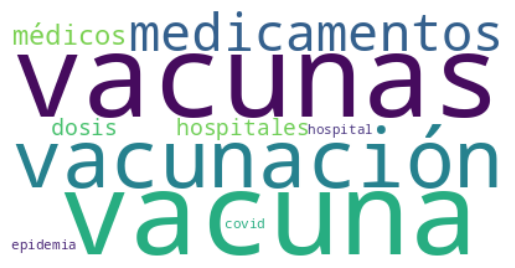

In [20]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=0)

In [21]:
hierarchical_topics = topic_model.hierarchical_topics(speeches)

100%|██████████| 113/113 [00:00<00:00, 170.67it/s]


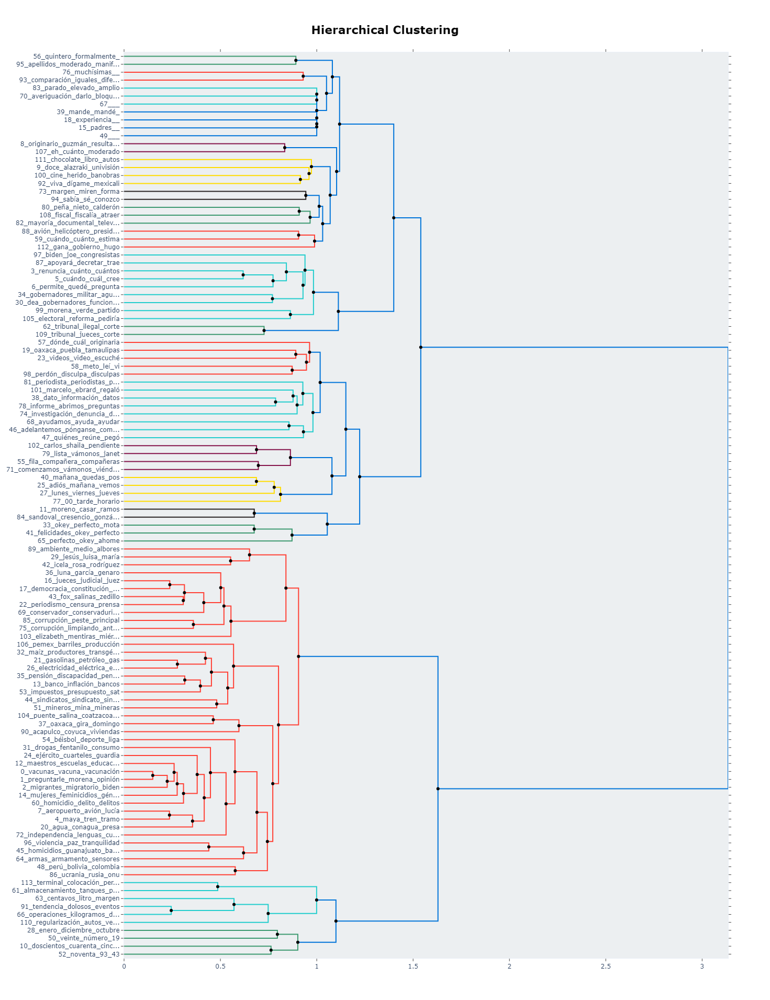

In [23]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)


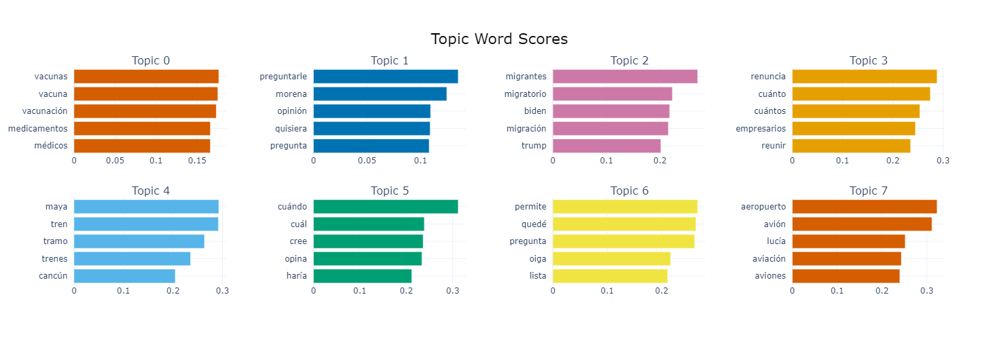

In [17]:
topic_model.visualize_barchart(top_n_topics=8)

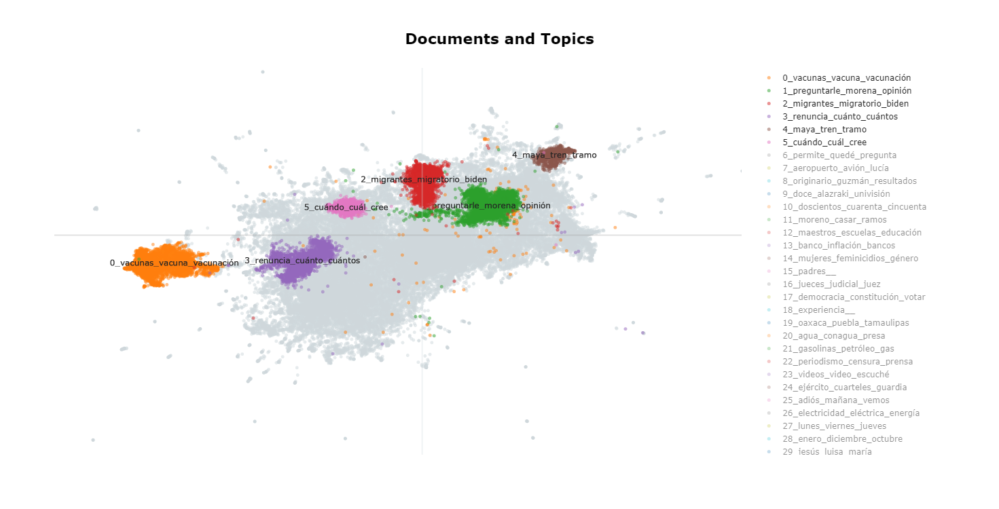

In [18]:
topic_model.visualize_documents(speeches, reduced_embeddings=reduced_embeddings_2d, hide_document_hover=True)


In [25]:
#topic_model.visualize_document_datamap(docs, reduced_embeddings=reduced_embeddings)

In [27]:
topic_distr, topic_token_distr = topic_model.approximate_distribution(speeches, calculate_tokens=True)


100%|██████████| 105/105 [02:45<00:00,  1.57s/it]


In [28]:
df = topic_model.visualize_approximate_distribution(speeches[1], topic_token_distr[1])


In [29]:
df

,Gracias,presidente,Buenos,días,Mire,en,esta,semana,van,dos,periodistas,asesinados,yo,le,quiero,preguntar,la,Fiscalía,para,Delitos,Contra,la,Libertad,de,Expresión,tiene,una,impunidad,de,98,por,ciento,en,los,casos,que,toma,Qué,hará,diferente,específicamente,su,Gobierno,lo,que,hizo,el,Gobierno,de,Calderón,el,Gobierno,de,Peña,Nieto,para,acabar,con,esta,tragedia,que,aqueja,al,gremio,periodístico
27_lunes_viernes_jueves_miércoles,0.000,0.000,0.000,0.000,0.000,0.138,0.277,0.277,0.277,0.138,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
52_noventa_93_43_cuarenta,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.120,0.241,0.241,0.241,0.120,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
67____,0.219,0.219,0.219,0.219,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
80_peña_nieto_calderón_expresidente,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.221,0.443,0.664,0.885,0.905,1.018,1.130,1.169,1.083,0.749,0.416,0.156,0.000,0.000,0.000,0.000,0.000,0.000,0.000
81_periodista_periodistas_periodismo_independientes,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.189,0.340,0.491,0.641,0.453,0.302,0.151,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
108_fiscal_fiscalía_atraer_auditorías,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.119,0.238,0.238,0.238,0.119,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
112_gana_gobierno_hugo_chiapas,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.443,0.885,0.885,1.328,1.328,0.885,0.885,0.443,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
